# Audio source separation

In [1]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.signal.windows import hamming

import stft
import IPython.display as ipd
from scipy.io.wavfile import write

plt.rcParams['figure.figsize'] = (12,8)

In [2]:
# useful functions

def plot_sound(data, rate, title=None):
    if data.ndim == 1:
        data = data[:,np.newaxis]
    times = np.arange(data.shape[0])/rate
    plt.figure(figsize=(30,6))
    for channel in data.T:
        plt.fill_between(times, channel)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.xlim(times[0], times[-1])
    if title:
        plt.title(title)
    plt.show()
    
def play_sound(data, rate):
    return ipd.display(ipd.Audio(data.T, rate=rate))

T = 220501, M = 2


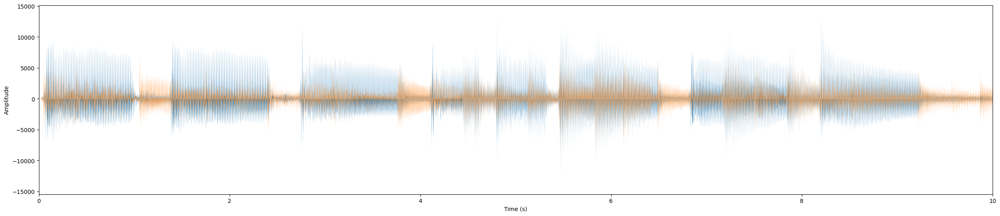

In [3]:
fname = 'mix.wav'

rate, x = wavfile.read(fname)
print('T = {:d}, M = {:d}'.format(*x.shape))
plot_sound(x, rate)
play_sound(x, rate)

In [4]:
#write('new_mix.wav', rate, np.array(x, dtype=np.int16)) # to write a new wave file

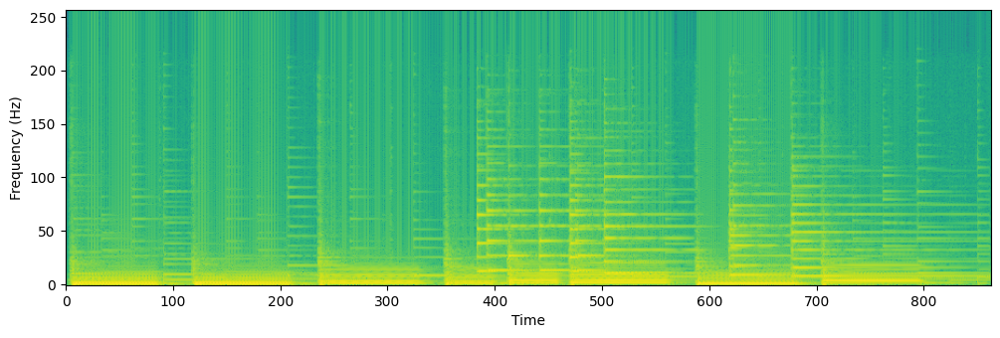

In [5]:
X = stft.spectrogram(x, window=hamming, framelength=512)
Z = X.view(dtype=np.complex128)[...,0]

X_norm = np.abs(Z)**2

plt.imshow(np.log(X_norm+1e-10), origin='lower')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show()

___

Lab session recap :

1]

When listening to the mix.wav audio file, we can hear $K = 3$ instruments, a bass guitar from the left, a guitar from the right, and a piano seemingly from the front (its sound is balanced, unlike the other two instruments).

2]

We wish to plot the the temporal dispersion diagram :


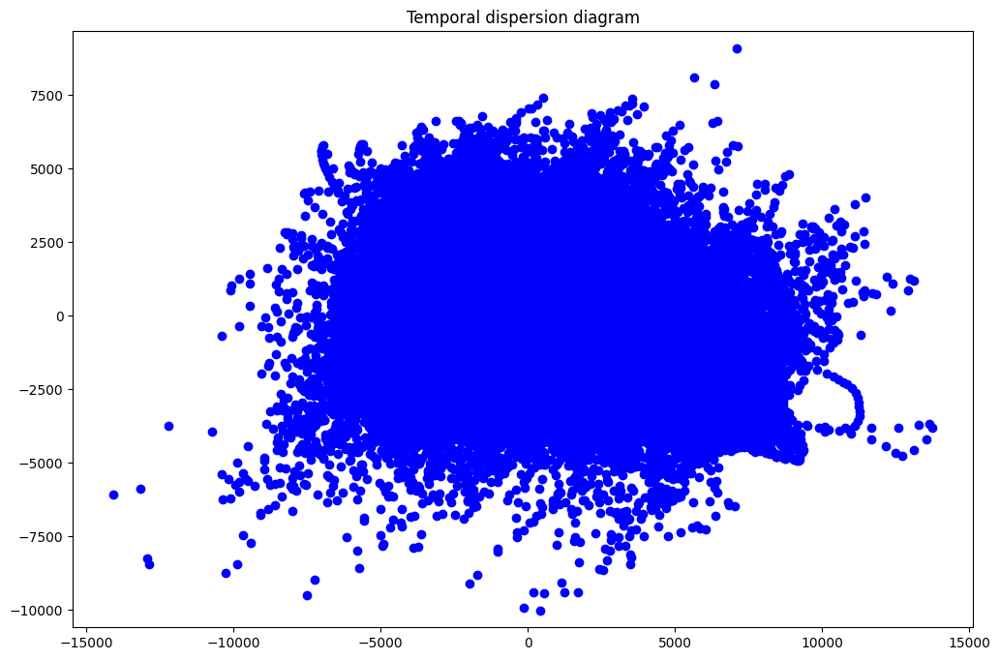

In [6]:
x1 = x[:,0]
x2 = x[:,1]

plt.scatter(x1,x2,color='b')
plt.title("Temporal dispersion diagram")
plt.axis('equal')
plt.show()

We cannot distinguish any direction. It looks completely random, nothing can be deduced from this plot.

We need to plot the time-frequency dispersion diagram instead of the temporal dispersion diagram to get some information.

3] This question was already tackled few code blocks above, with the line of code :

$\it{plt.imshow(np.log(X_{norm}+10^{-10}), origin='lower')}$

We can plot the time-frequency representation of each channel :

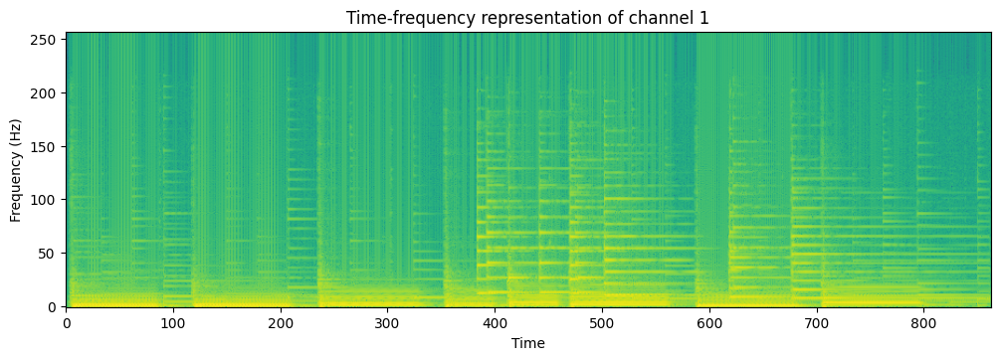

In [7]:
X1 = stft.spectrogram(x1, window=hamming, framelength=512)
X1_norm = np.abs(X1)**2
plt.imshow(np.log(X1_norm+1e-10), origin='lower')
plt.title("Time-frequency representation of channel 1")
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show()

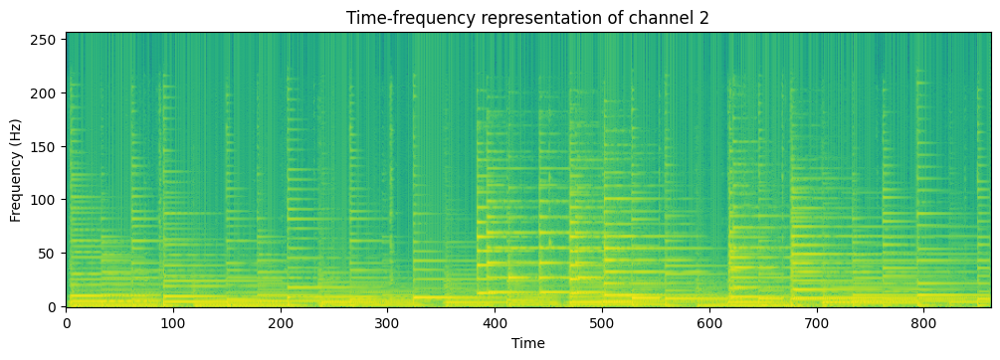

In [8]:
X2 = stft.spectrogram(x2, window=hamming, framelength=512)
X2_norm = np.abs(X2)**2
plt.imshow(np.log(X2_norm+1e-10), origin='lower')
plt.title("Time-frequency representation of channel 2")
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show() 

4] We now wish to plot the time-frequency dispersion diagram

c:\Users\Arnaud\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\Arnaud\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\collections.py:197: ComplexWarning: Casting complex values to real discards the imaginary part
  offsets = np.asanyarray(offsets, float)


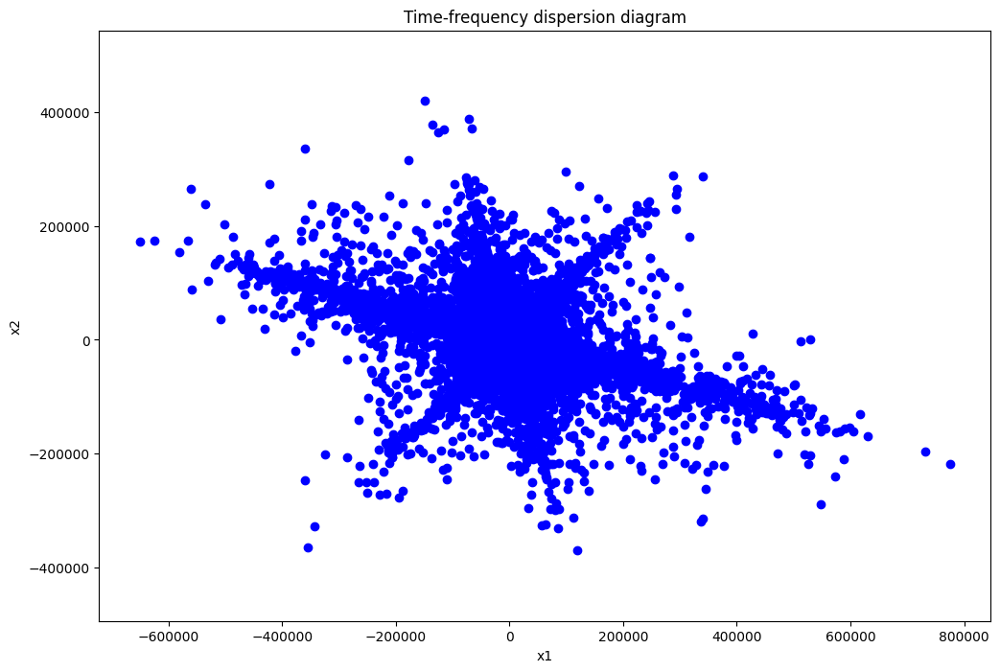

In [9]:
plt.scatter(X1, X2, color='b')
plt.title("Time-frequency dispersion diagram")
plt.axis('equal')
plt.xlabel('x1')
plt.ylabel('x2')
plt.show()

We can disinguish the directions of the sources, since we can see 3 distinct straight lines corresponding to the 3 different instruments we can hear in the mix.wav audio.

We can also guess that the line "in the middle" ($\frac{\pi}{4}$ rad in the trigonometric circle from the horizontal line) matches a balanced audio between the two channels, thus corresponding to the piano sound.

Thus the straight line at $\frac{2\pi}{3}$ would be the instrument on the left, the bass guitar, and the straight line at $-\frac{\pi}{6}$ would be the instrument we can hear on the right, the guitar.

We can standardize the plot to have smaller time and frequency scales :

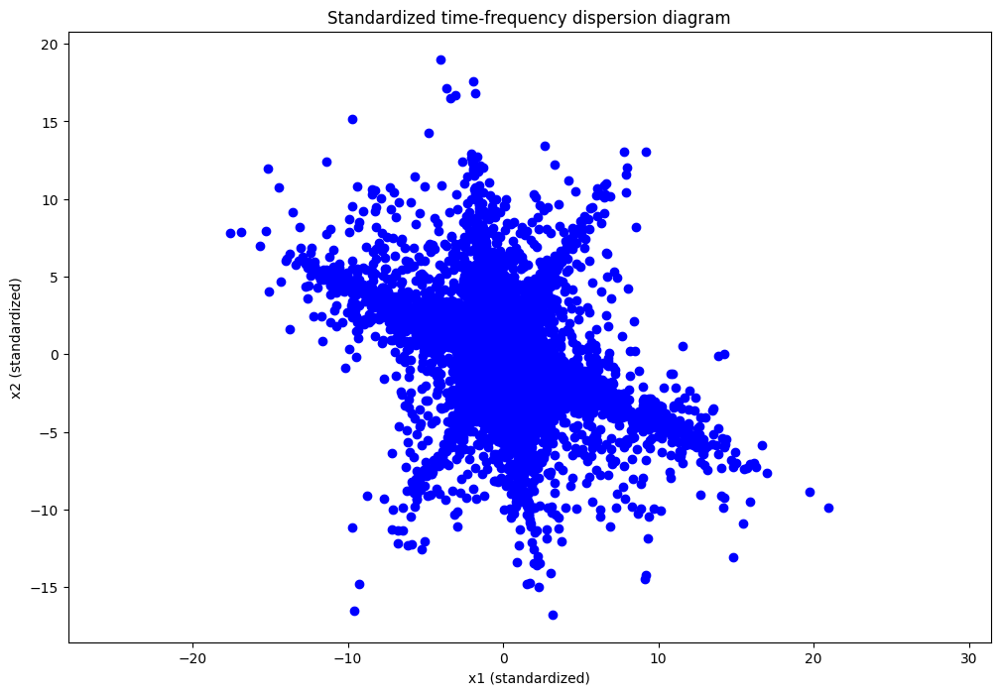

In [10]:
X1_standardized = (X1 - np.mean(X1)) / np.std(X1)
X2_standardized = (X2 - np.mean(X2)) / np.std(X2)

plt.scatter(X1_standardized, X2_standardized, color='b')
plt.title("Standardized time-frequency dispersion diagram")
plt.axis('equal')
plt.xlabel('x1 (standardized)')
plt.ylabel('x2 (standardized)')
plt.show()

We will still be using the non-standardized value to have the exact values for the next questions.
___

5] I used arctan2 that seemed to work for arrays giving both y and x as arguments
https://numpy.org/doc/2.1/reference/generated/numpy.arctan2.html

We can verify that this function works correctly by checking if the number of angles match the number of time-frequency points (done by the assert function)

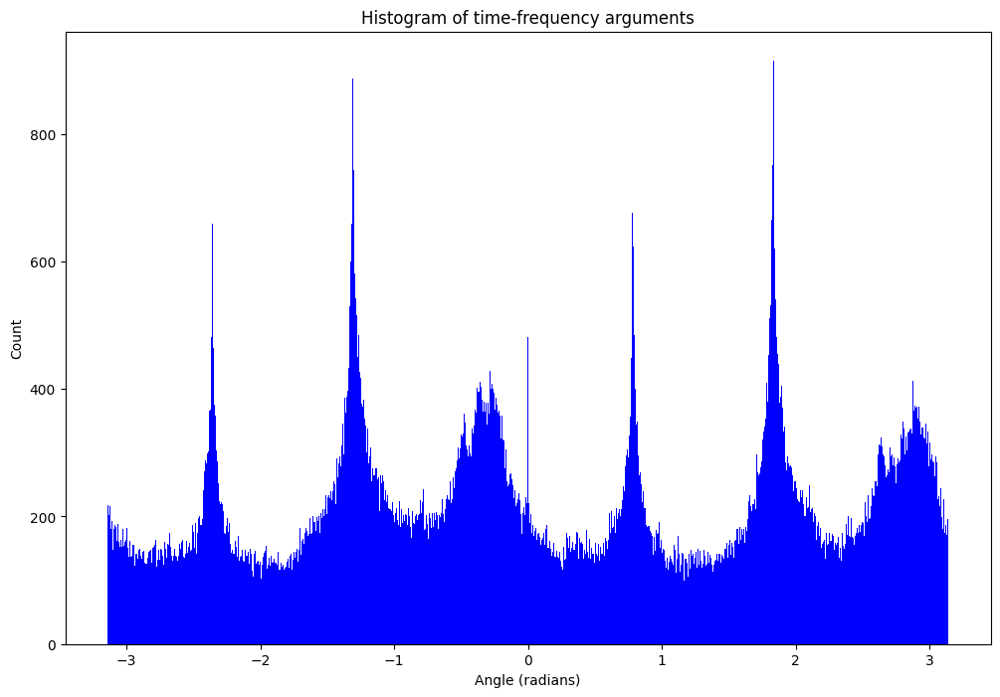

In [11]:
angles = np.arctan2(X2.real,X1.real).flatten()
assert len(angles) == X1.shape[0]*X1.shape[1] #The number of angles match the number of time-frequency points

plt.hist(angles, bins=1000, color='b')
plt.xlabel('Angle (radians)')
plt.ylabel('Count')
plt.title('Histogram of time-frequency arguments')
plt.show()

Since we're only interest in the angles between $-\frac{\pi}{2}$ and , we adjust the plot :

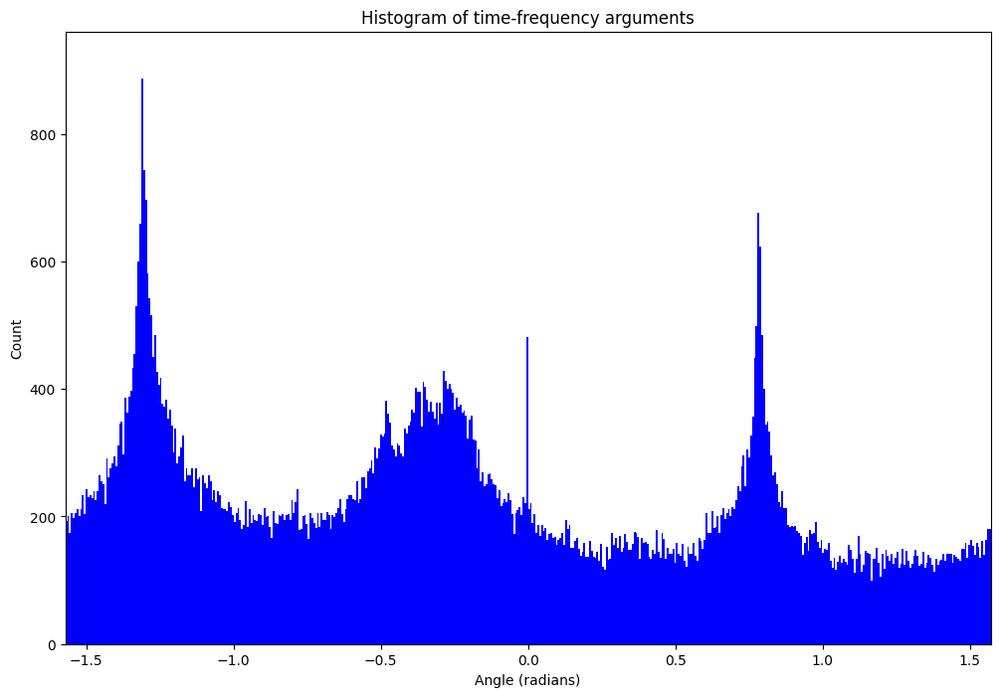

In [12]:
angles = np.arctan2(X2.real,X1.real).flatten()
plt.hist(angles, bins=1000, color='b')
plt.xlabel('Angle (radians)')
plt.ylabel('Count')
plt.title('Histogram of time-frequency arguments')
plt.xlim(-np.pi/2, np.pi/2)
plt.show()

Graphically, we get spikes at :

$\theta _0 = -0.31$ rad

For $\theta _0$, we can clearly see that there is a greater single spike at $theta _0 = 0$, but I tried using 0 rad to compute the audio and the noise was a bit worse, thus choosing $\theta _0 = -0.31$ rad to improve slightly the quality.

$\theta _1 = -1.31$ rad

$\theta _2 = 0.78$ rad


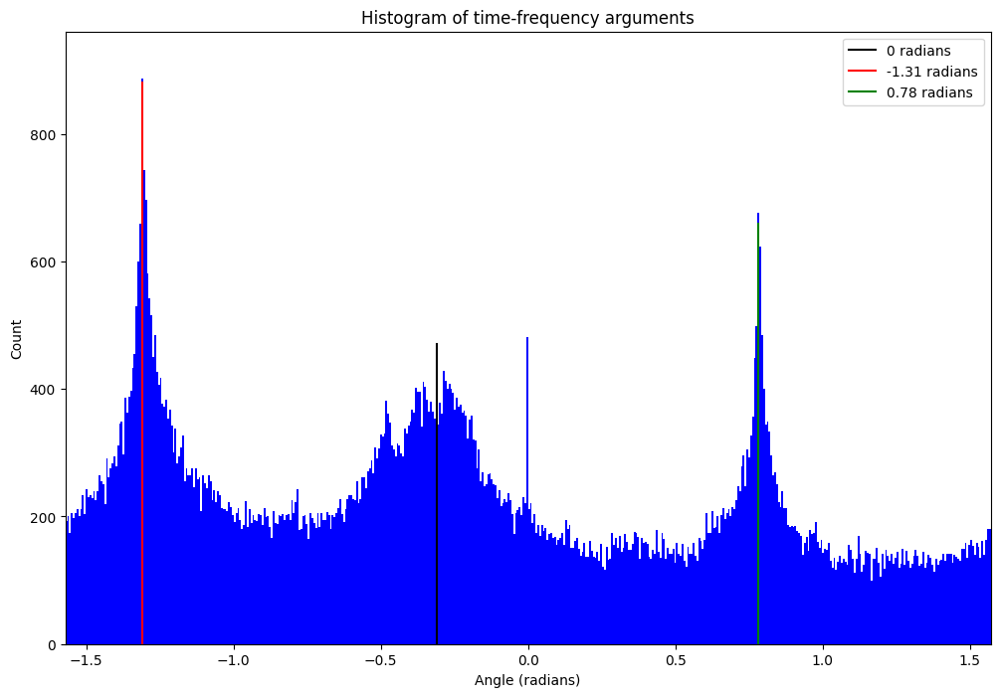

In [13]:
theta0 = -0.31
theta1 = -1.31
theta2 = 0.78

plt.hist(angles, bins=1000, color='b')
plt.plot([theta0,theta0], [0, 470], color='black', label='0 radians')
plt.plot([theta1,theta1], [0, 880], color='r', label='-1.31 radians')
plt.plot([theta2,theta2], [0, 660], color='g', label='0.78 radians')
plt.xlabel('Angle (radians)')
plt.ylabel('Count')
plt.legend()
plt.title('Histogram of time-frequency arguments')
plt.xlim(-np.pi/2, np.pi/2)
plt.show()

6] & 7] 

### Important note :

I heavily modified both the structure of the code used, and the stft library since the mdct library wasn't working (and it was relying on stft, which I heavily modified to get the expected results). I added a zip file containing the stft library I used for the computation.

In [14]:
def mask_angle(angle):
    spikes_angles = np.array([theta0,theta0+np.pi,theta0-np.pi,theta1,theta1+np.pi,theta1-np.pi,theta2,theta2-np.pi,theta2+np.pi])
    min_pos = np.argmin(np.abs(spikes_angles-angle))
    if min_pos < 3:
        return 0 #The closest angle is theta_0
    elif 3 <= min_pos < 6:
        return 1 #The closest angle is theta_1
    else:
        return 2 #The closest angle is theta_2

In [15]:
frequency_length = X1.shape[0]
time_length = X1.shape[1]

Y0 = np.zeros((frequency_length, time_length, 2), dtype=complex)
Y1 = np.zeros((frequency_length, time_length, 2), dtype=complex)
Y2 = np.zeros((frequency_length, time_length, 2), dtype=complex)

for i in range(frequency_length):
    for j in range(time_length):
        x1_val = X1[i,j]
        x2_val = X2[i,j]
        angle = np.arctan2(x2_val.real,x1_val.real)
        mask_angle_val = mask_angle(angle)
        if mask_angle_val == 0:
            Y0[i,j] = X[i,j]
        elif mask_angle_val == 1:
            Y1[i,j] = X[i,j]
        else:
            Y2[i,j] = X[i,j]

y0 = stft.ispectrogram(Y0, window=hamming, framelength=512, halved=True)
y1 = stft.ispectrogram(Y1, window=hamming, framelength=512, halved=True)
y2 = stft.ispectrogram(Y2, window=hamming, framelength=512, halved=True)

In [16]:
play_sound(y0, rate)
play_sound(y1, rate)
play_sound(y2, rate)

In [17]:
write('mix_spatialized_bass.wav', rate, np.array(y0, dtype=np.int16))
write('mix_spatialized_guitar.wav', rate, np.array(y1, dtype=np.int16))
write('mix_spatialized_piano.wav', rate, np.array(y2, dtype=np.int16))

We can clearly hear the 3 distinct instruments. We also guessed correctly all the instruments :

If $\theta$ was close to $\frac{\pi}{4}$ (which was $\theta _2 = 0.78$), we had a balance of amplitude between channel 1 and channel 2, thus having the piano sound for y2.

Thus, modulo $\frac{\pi}{2}$, the angle on the left trigonometrically-speaking was on the left of the piano, thus $\theta _0 = -0.31$ being the instrument on the left, the bass guitar.

The last one, on the right, is the guitar.

The spatiality of the audio has been more or less correctly conserved. We can still distinguish the directions of each source.

However, the audio quality is really bad. There is a kind of bubbly noise in the background, most particularly in the guitar audio. My guess is that this noise comes from the fact that we try to assign each frequency at each time only to a single instrument, when sometimes the frequencies of all instruments can overlap themselves.

The bass sound is clear enough, the piano sound is also good enough, but the guitar sound is terrible.

In [18]:
play_sound(y0+y1+y2, rate) #The sum of y1, y2, and y3 is exactly the original mix.wav file

9] To try to remove this noise and improve the spatiality of the separated audio, we will implement the MMSE estimator $S(f,n,k)$ of source $k$

We use the slide 41/48 from the slides to do the calculations :

- We first compute $\Sigma _{ss}$ from the empirical covariance
- Then we compute $\Sigma _{xx} (f,n) = A(f) \Sigma _{ss} A(f)^H$
- Then we compute $\Sigma _{sx} = \Sigma _{ss}(f,n)A(f)^H$ 
- We finally compute $B(f,n) = \Sigma _{sx}(f,n)\Sigma _{xx}(f,n)^{-1}$
- We then get $y(f,n) = B(f,n)x(f,n)$

In [19]:
sigma0 = np.abs(Y0[:,:,0])**2
sigma1 = np.abs(Y1[:,:,0])**2
sigma2 = np.abs(Y2[:,:,0])**2

Sigma_ss = np.zeros((frequency_length,time_length,3,3),dtype=complex)
for k,sigma in enumerate([sigma0,sigma1,sigma2]):
    Sigma_ss[:,:,k,k] = sigma

A = np.array([[np.cos(theta0),np.cos(theta1),np.cos(theta2)],[np.sin(theta0),np.sin(theta1),np.sin(theta2)]])
A_H = A.conj().T
y = np.zeros((frequency_length,time_length,3),dtype=complex)

for f in range(frequency_length):
    for n in range(time_length):
        Sigma_ss_fn = Sigma_ss[f,n]
        Sigma_xx_fn = A @ Sigma_ss_fn @ A_H
        Sigma_sx_fn = Sigma_ss_fn @ A_H
        try:
            B_fn = Sigma_sx_fn @ np.linalg.inv(Sigma_xx_fn)
        except: #If Sigma_xx_fn is singular
            B_fn = Sigma_sx_fn @ np.linalg.pinv(Sigma_xx_fn)
        y[f,n] = B_fn @ X[f,n]

In [20]:
y0 = stft.ispectrogram(y[:,:,0], window=hamming, framelength=512, halved=True)
y1 = stft.ispectrogram(y[:,:,1], window=hamming, framelength=512, halved=True)
y2 = stft.ispectrogram(y[:,:,2], window=hamming, framelength=512, halved=True)

play_sound(y0, rate)
play_sound(y1, rate)
play_sound(y2, rate)

play_sound(y0+y1+y2, rate)

First of all, the quality of the audio is worse than the previous transformation, and we lost any kind of spatiality with this transformation. The sum of all 3 signals sounds strange, and it seems like some kind of reverb/noise was added to the mix obtained.

Overall, the MMSE estimator performed worse than the "angle method" dealing with source separation and audio reconstruction. The instrument are correctly separated, but the audio quality is worse, and spatiality was lost in the process.

10] We now wish to respatialize the sources, i.e. to make the sound stereo again and "hear" the position of each instrument.

In [21]:
S0 = np.zeros((frequency_length, time_length, 2), dtype=complex)
S1 = np.zeros((frequency_length, time_length, 2), dtype=complex)
S2 = np.zeros((frequency_length, time_length, 2), dtype=complex)

for f in range(frequency_length):
    for n in range(time_length):
        S0[f,n,0] = y[f,n,0]*np.cos(theta0)
        S0[f,n,1] = y[f,n,0]*np.sin(theta0)
        S1[f,n,0] = y[f,n,1]*np.cos(theta1)
        S1[f,n,1] = y[f,n,1]*np.sin(theta1)
        S2[f,n,0] = y[f,n,2]*np.cos(theta2)
        S2[f,n,1] = y[f,n,2]*np.sin(theta2)

y0 = stft.ispectrogram(S0, window=hamming, framelength=512, halved=True)
y1 = stft.ispectrogram(S1, window=hamming, framelength=512, halved=True)
y2 = stft.ispectrogram(S2, window=hamming, framelength=512, halved=True)

In [22]:
play_sound(y0, rate)
play_sound(y1, rate)
play_sound(y2, rate)

play_sound(y0+y1+y2, rate)

The audio quality is the same as before, but this time the sources are respatialized correctly. We can still hear noise/reverb added with the MMSE estimator. 

Let's try to permute the the directions of the sources :

In [23]:
S0 = np.zeros((frequency_length, time_length, 2), dtype=complex)
S1 = np.zeros((frequency_length, time_length, 2), dtype=complex)
S2 = np.zeros((frequency_length, time_length, 2), dtype=complex)

for f in range(frequency_length):
    for n in range(time_length):
        S0[f,n,0] = y[f,n,0]*np.cos(theta1)
        S0[f,n,1] = y[f,n,0]*np.sin(theta1)
        S1[f,n,0] = y[f,n,1]*np.cos(theta2)
        S1[f,n,1] = y[f,n,1]*np.sin(theta2)
        S2[f,n,0] = y[f,n,2]*np.cos(theta0)
        S2[f,n,1] = y[f,n,2]*np.sin(theta0)

y0 = stft.ispectrogram(S0, window=hamming, framelength=512, halved=True)
y1 = stft.ispectrogram(S1, window=hamming, framelength=512, halved=True)
y2 = stft.ispectrogram(S2, window=hamming, framelength=512, halved=True)

In [24]:
play_sound(y0, rate)
play_sound(y1, rate)
play_sound(y2, rate)

play_sound(y0+y1+y2, rate)

It works just fine, the sources are rotated (piano on the left, guitar in the middle, bass on the right). Nonetheless, the noise is still present. Respatialization has been done correctly, since it had no impact on the quality of the audio.